In [1]:
! pip install prophet

In [2]:
! pip install plotly==5.11.0

In [3]:
! pip install seaborn

In [4]:
import plotly.io as pio
import matplotlib.pyplot as plt
import pandas as pd
import plotly.express as px  
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly
import seaborn as sns
from sklearn.metrics import r2_score as r2, mean_absolute_error as mae, mean_absolute_percentage_error as mape

In [5]:
import cmdstanpy
cmdstanpy.install_cmdstan()
cmdstanpy.install_cmdstan(compiler=True)

Installing CmdStan version: 2.31.0
Install directory: /Users/christina___99/.cmdstan
CmdStan version 2.31.0 already installed
Installing CmdStan version: 2.31.0
Install directory: /Users/christina___99/.cmdstan
CmdStan version 2.31.0 already installed


True

# Preparing Daily, Monthly, and Yearly Datasets

In [6]:
df = pd.read_csv("Electric_Consumption_And_Cost__2010_-_Feb_2022_.csv")

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/531678759.py:1: DtypeWarning: Columns (17) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("Electric_Consumption_And_Cost__2010_-_Feb_2022_.csv")


In [7]:
df.dtypes

Development Name       object
Borough                object
Account Name           object
Location               object
Meter AMR              object
Meter Scope            object
TDS #                 float64
EDP                     int64
RC Code                object
Funding Source         object
AMP #                  object
Vendor Name            object
UMIS BILL ID            int64
Revenue Month          object
Service Start Date     object
Service End Date       object
# days                float64
Meter Number           object
Estimated              object
Current Charges        object
Rate Class             object
Bill Analyzed          object
Consumption (KWH)       int64
KWH Charges            object
Consumption (KW)       object
KW Charges             object
Other charges          object
dtype: object

In [8]:
df['Revenue Month'] = pd.to_datetime(df['Revenue Month'])

In [9]:
df.dtypes

Development Name              object
Borough                       object
Account Name                  object
Location                      object
Meter AMR                     object
Meter Scope                   object
TDS #                        float64
EDP                            int64
RC Code                       object
Funding Source                object
AMP #                         object
Vendor Name                   object
UMIS BILL ID                   int64
Revenue Month         datetime64[ns]
Service Start Date            object
Service End Date              object
# days                       float64
Meter Number                  object
Estimated                     object
Current Charges               object
Rate Class                    object
Bill Analyzed                 object
Consumption (KWH)              int64
KWH Charges                   object
Consumption (KW)              object
KW Charges                    object
Other charges                 object
d

In [10]:
df

,Development Name,Borough,Account Name,Location,Meter AMR,Meter Scope,TDS #,EDP,RC Code,Funding Source,...,Meter Number,Estimated,Current Charges,Rate Class,Bill Analyzed,Consumption (KWH),KWH Charges,Consumption (KW),KW Charges,Other charges
0,ADAMS,BRONX,ADAMS,BLD 05,NONE,BLD 01 to 07,118.0,248,B011800,FEDERAL,...,7223256,N,"15,396.82",GOV/NYC/068,Yes,128800,"7,387.97",216,"2,808","5,200.85"
1,ADAMS,BRONX,ADAMS,BLD 05,NONE,BLD 01 to 07,118.0,248,B011800,FEDERAL,...,7223256,N,"14,556.34",GOV/NYC/068,Yes,115200,"6,607.87",224,"2,912","5,036.47"
2,ADAMS,BRONX,ADAMS,BLD 05,NONE,BLD 01 to 07,118.0,248,B011800,FEDERAL,...,7223256,N,"13,904.98",GOV/NYC/068,Yes,103200,"5,919.55",216,"2,808","5,177.43"
3,ADAMS,BRONX,ADAMS,BLD 05,NONE,BLD 01 to 07,118.0,248,B011800,FEDERAL,...,7223256,N,"14,764.04",GOV/NYC/068,Yes,105600,"6,057.22",208,"2,704","6,002.82"
4,ADAMS,BRONX,ADAMS,BLD 05,NONE,BLD 01 to 07,118.0,248,B011800,FEDERAL,...,7223256,N,"13,729.54",GOV/NYC/068,Yes,97600,"5,598.34",216,"2,808","5,323.20"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
407026,WYCKOFF GARDENS,BROOKLYN,WYCKOFF GARDENS,BLD 02,INTERVAL,NaN,163.0,272,K016300,FEDERAL,...,1096666,Y,"4,765.63",GOV/NYC/068,Exception,0,0,150.48,"1,769.64","2,995.99"
407027,WYCKOFF GARDENS,BROOKLYN,WYCKOFF GARDENS,BLD 03,INTERVAL,NaN,163.0,272,K016300,FEDERAL,...,1096667,Y,"4,275.38",GOV/NYC/068,Exception,0,0,135,"1,587.60","2,687.78"
407028,WYCKOFF GARDENS,BROOKLYN,WYCKOFF GARDENS,BLD 03,AMR,NaN,163.0,272,K016300,FEDERAL,...,8096664,Y,"6,213.06",GOV/NYC/068,Exception,59600,"2,307.12",0,0,"3,905.94"
407029,WYCKOFF GARDENS,BROOKLYN,WYCKOFF GARDENS,BLD 02,AMR,NaN,163.0,272,K016300,FEDERAL,...,8096666,Y,"8,756.66",GOV/NYC/068,Exception,84000,"3,251.64",0,0,"5,505.02"


In [11]:
df['Revenue Month'] = pd.to_datetime(df['Revenue Month'])

In [12]:
monthly_data = df.groupby(['Revenue Month'])[['Consumption (KWH)']].mean(numeric_only=True).reset_index()

In [13]:
df2 = monthly_data.copy()
df3 = monthly_data.copy()

In [14]:
df2['Revenue Month'] = pd.to_datetime(df2['Revenue Month'], format='%Y/%m/%d')
daily_data = df2.set_index('Revenue Month').resample('D').ffill().reset_index()
df3['Revenue Month'] = pd.to_datetime(df3['Revenue Month'], format='%Y/%m/%d')
yearly_data = df3.set_index('Revenue Month').resample('y').ffill().reset_index()

In [15]:
daily_data

,Revenue Month,Consumption (KWH)
0,2010-01-01,45446.030782
1,2010-01-02,45446.030782
2,2010-01-03,45446.030782
3,2010-01-04,45446.030782
4,2010-01-05,45446.030782
...,...,...
4379,2021-12-28,26110.544916
4380,2021-12-29,26110.544916
4381,2021-12-30,26110.544916
4382,2021-12-31,26110.544916


In [16]:
monthly_data

,Revenue Month,Consumption (KWH)
0,2010-01-01,45446.030782
1,2010-02-01,38808.144583
2,2010-03-01,36667.210941
3,2010-04-01,36808.514463
4,2010-05-01,36933.632880
...,...,...
116,2021-09-01,33186.180491
117,2021-10-01,25960.355783
118,2021-11-01,25986.352243
119,2021-12-01,26110.544916


In [17]:
yearly_data

,Revenue Month,Consumption (KWH)
0,2010-12-31,40121.199113
1,2011-12-31,40121.199113
2,2012-12-31,33311.049366
3,2013-12-31,31235.686828
4,2014-12-31,30404.677506
5,2015-12-31,27909.219735
6,2016-12-31,27725.989676
7,2017-12-31,28594.297671
8,2018-12-31,28594.297671
9,2019-12-31,27558.740576


In [18]:
def plot_Yearly_data(df2,col1,col2,title):
  fig = px.line(df2, x=col1,y=col2, title=title)
  fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=10, label="1y", step="year", stepmode="backward"),
            dict(count=20, label="10y", step="year", stepmode="backward"),
            dict(count=30, label="20y", step="year", stepmode="backward"),
            dict(step="all")
        ])
     )
  )
  fig.update_layout(
    title="Yearly mean",
    xaxis_title="Date",
    yaxis_title="total")
  return fig.show()

In [19]:
#100/200/365
def plot_data(df2,col1,col2,title):
  fig = px.line(df2, x=col1,y=col2, title=title)
  fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=10, label="100", step="day", stepmode="backward"),
            dict(count=20, label="200", step="day", stepmode="backward"),
            dict(count=30, label="365", step="day", stepmode="backward"),
            dict(step="all")
        ])
     )
  )
  fig.update_layout(
    title="Daily",
    xaxis_title="Date",
    yaxis_title="Energy Consumption (KWH)")
  return fig.show()

In [20]:
plot_data(df2=daily_data,col1='Revenue Month',col2='Consumption (KWH)',title='Daily Mean consumption')

In [21]:
plot_Yearly_data(df2=yearly_data,col1='Revenue Month',col2='Consumption (KWH)',title='Yearly Mean consumption')

# Daily Data Forecast

In [22]:
daily_data.columns = ['ds','y']
daily_data

,ds,y
0,2010-01-01,45446.030782
1,2010-01-02,45446.030782
2,2010-01-03,45446.030782
3,2010-01-04,45446.030782
4,2010-01-05,45446.030782
...,...,...
4379,2021-12-28,26110.544916
4380,2021-12-29,26110.544916
4381,2021-12-30,26110.544916
4382,2021-12-31,26110.544916


In [23]:
m = Prophet()
m.fit(daily_data)

20:32:45 - cmdstanpy - INFO - Chain [1] start processing
20:32:47 - cmdstanpy - INFO - Chain [1] done processing


In [24]:
future_100D = m.make_future_dataframe(periods=100, freq='D')
predict_100D = m.predict(future_100D)
predict_100D[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2010-01-01,43165.938040,39309.685147,46694.386506
1,2010-01-02,43281.705720,39617.332954,46900.062309
2,2010-01-03,43402.728454,39703.241052,47195.385557
3,2010-01-04,43529.178987,40072.975925,47411.277402
4,2010-01-05,43617.920264,40091.784435,47421.278286
...,...,...,...,...
4479,2022-04-07,23628.972630,19861.465174,27191.494837
4480,2022-04-08,23577.271253,19621.914490,27116.032795
4481,2022-04-09,23574.745448,19940.354685,27329.196185
4482,2022-04-10,23584.865770,19888.075842,27099.401106


In [25]:
future_200D = m.make_future_dataframe(periods=200, freq='D')
predict_200D = m.predict(future_200D)
predict_200D[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2010-01-01,43165.938040,39549.156782,46860.772042
1,2010-01-02,43281.705720,39172.676748,47022.886002
2,2010-01-03,43402.728454,39875.542406,47296.862865
3,2010-01-04,43529.178987,39727.861587,47220.828215
4,2010-01-05,43617.920264,39910.486411,47513.779626
...,...,...,...,...
4579,2022-07-16,40339.322992,36509.265567,44101.248469
4580,2022-07-17,40392.730442,36566.843342,44008.280605
4581,2022-07-18,40398.136742,36692.247382,43868.931723
4582,2022-07-19,40319.167685,36657.951419,43987.918437


In [26]:
future_365D = m.make_future_dataframe(periods=365, freq='D')
predict_365D = m.predict(future_365D)
predict_365D[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2010-01-01,43165.938040,39363.219494,46749.998061
1,2010-01-02,43281.705720,39536.599952,47247.083874
2,2010-01-03,43402.728454,39777.935469,47310.536305
3,2010-01-04,43529.178987,39686.813430,47370.593690
4,2010-01-05,43617.920264,40001.209011,47172.447839
...,...,...,...,...
4744,2022-12-28,27471.276077,23537.793832,32008.753822
4745,2022-12-29,27481.014666,23411.984792,31378.324748
4746,2022-12-30,27516.375942,23824.474670,31506.611727
4747,2022-12-31,27602.194719,23663.869212,31896.573464


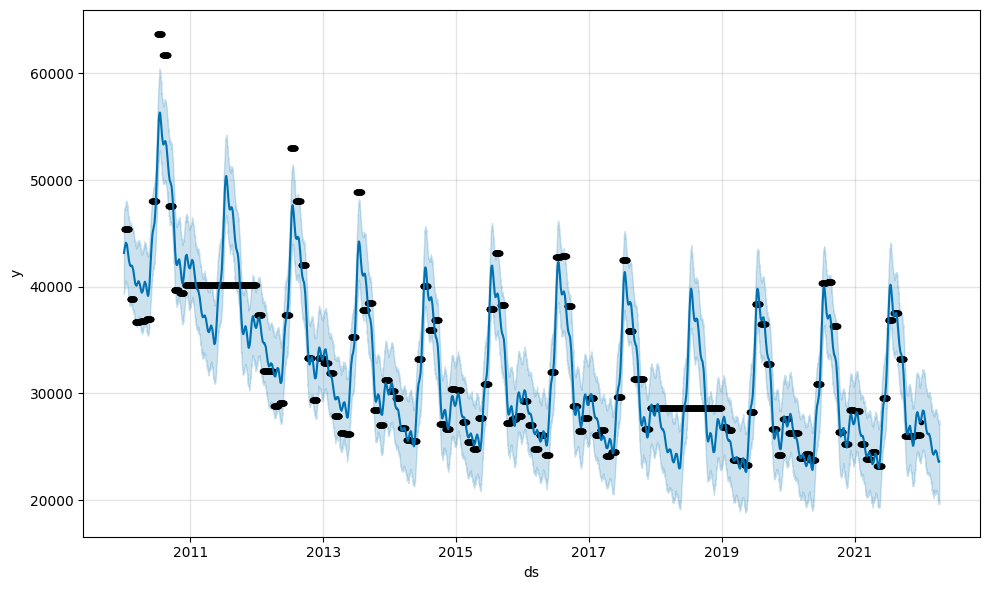

In [27]:
fig_100D = m.plot(predict_100D)

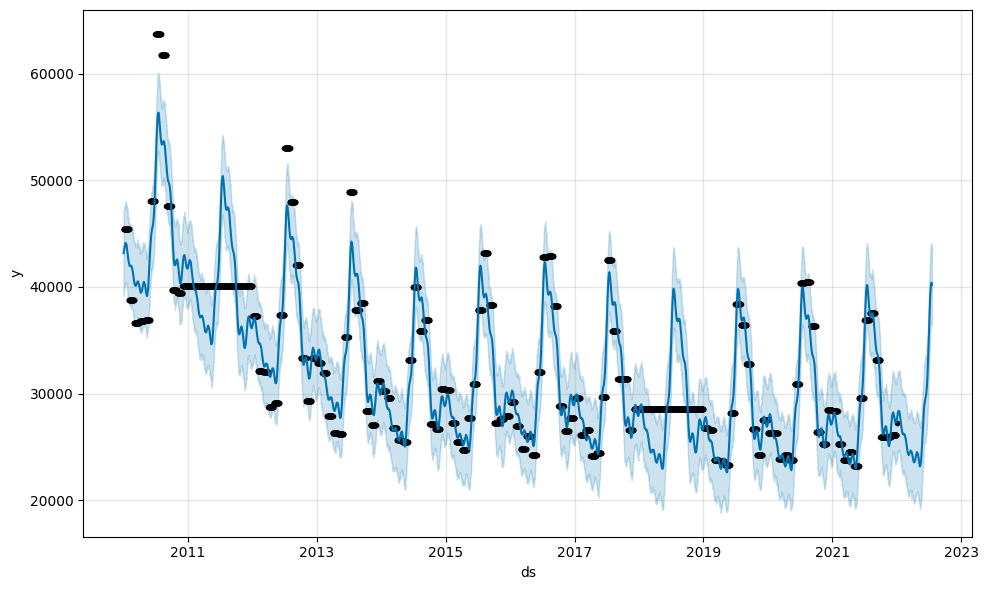

In [28]:
fig_200D = m.plot(predict_200D)

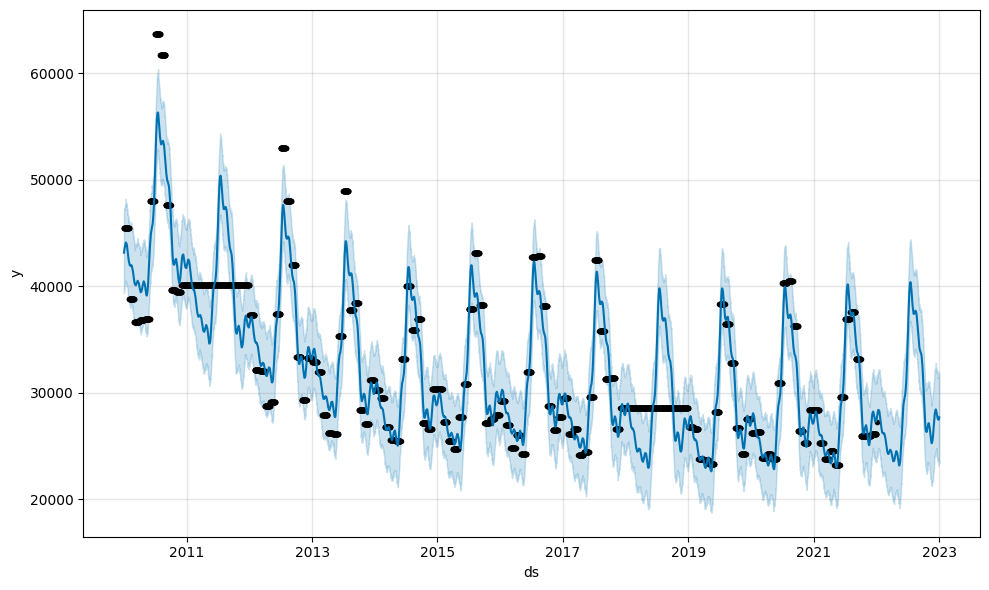

In [29]:
fig_365D = m.plot(predict_365D)

In [30]:
fig_plotly = plot_plotly(m, predict_365D)
fig_plotly.show()

In [31]:
fig_components = plot_components_plotly(m, predict_365D) 
fig_components.show()

# Monthly Data Forecast

In [32]:
monthly_data.columns = ['ds','y']
monthly_data

,ds,y
0,2010-01-01,45446.030782
1,2010-02-01,38808.144583
2,2010-03-01,36667.210941
3,2010-04-01,36808.514463
4,2010-05-01,36933.632880
...,...,...
116,2021-09-01,33186.180491
117,2021-10-01,25960.355783
118,2021-11-01,25986.352243
119,2021-12-01,26110.544916


In [33]:
m = Prophet()
m.fit(monthly_data)

20:32:57 - cmdstanpy - INFO - Chain [1] start processing
20:32:57 - cmdstanpy - INFO - Chain [1] done processing


In [34]:
future_1M = m.make_future_dataframe(periods=1, freq='M')
predict_1M = m.predict(future_1M)
predict_1M[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2010-01-01,44480.044499,41733.312695,47064.769150
1,2010-02-01,41680.757965,39030.771614,44330.993443
2,2010-03-01,39429.710718,36756.331684,41955.383931
3,2010-04-01,38635.831322,36095.603725,41000.959716
4,2010-05-01,38916.246888,36388.972542,41370.170912
...,...,...,...,...
117,2021-10-01,25948.474085,23479.537808,28425.979236
118,2021-11-01,24245.829561,21782.954971,26810.082626
119,2021-12-01,26722.089652,24041.387133,29115.512850
120,2022-01-01,27116.935837,24492.477561,29859.389033


In [35]:
future_6M = m.make_future_dataframe(periods=6, freq='M')
predict_6M = m.predict(future_6M)
predict_6M[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2010-01-01,44480.044499,41848.149709,47126.092074
1,2010-02-01,41680.757965,39085.427956,44225.360082
2,2010-03-01,39429.710718,36515.154009,41969.504061
3,2010-04-01,38635.831322,36127.613871,41199.242039
4,2010-05-01,38916.246888,36189.134785,41561.340864
...,...,...,...,...
122,2022-02-28,22178.402840,19643.684277,24683.456551
123,2022-03-31,22143.752491,19863.749369,24752.292745
124,2022-04-30,25396.326167,22709.005639,27800.838375
125,2022-05-31,29335.826457,26769.090007,31862.086911


In [36]:
future_9M = m.make_future_dataframe(periods=9, freq='M')
predict_9M = m.predict(future_9M)
predict_9M[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2010-01-01,44480.044499,41963.755453,47365.377630
1,2010-02-01,41680.757965,39005.366997,44288.103535
2,2010-03-01,39429.710718,36974.670906,41970.158227
3,2010-04-01,38635.831322,36001.023046,41241.642882
4,2010-05-01,38916.246888,36488.510089,41396.135917
...,...,...,...,...
125,2022-05-31,29335.826457,26652.271123,32059.373116
126,2022-06-30,35998.998217,33406.663407,38672.419951
127,2022-07-31,38823.681649,36286.446649,41303.218586
128,2022-08-31,33717.026746,31206.434821,36362.391867


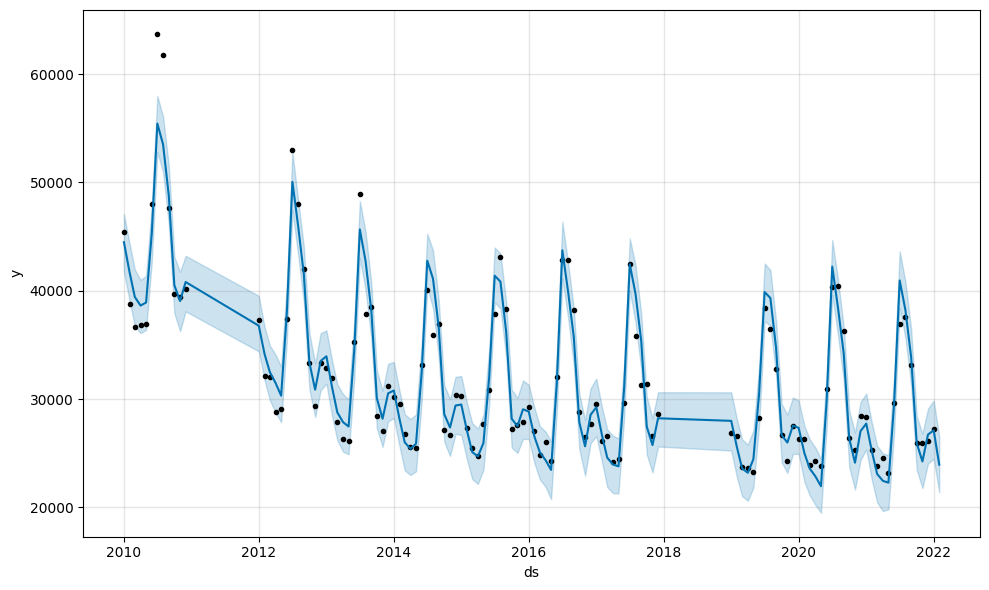

In [37]:
fig_1M = m.plot(predict_1M)

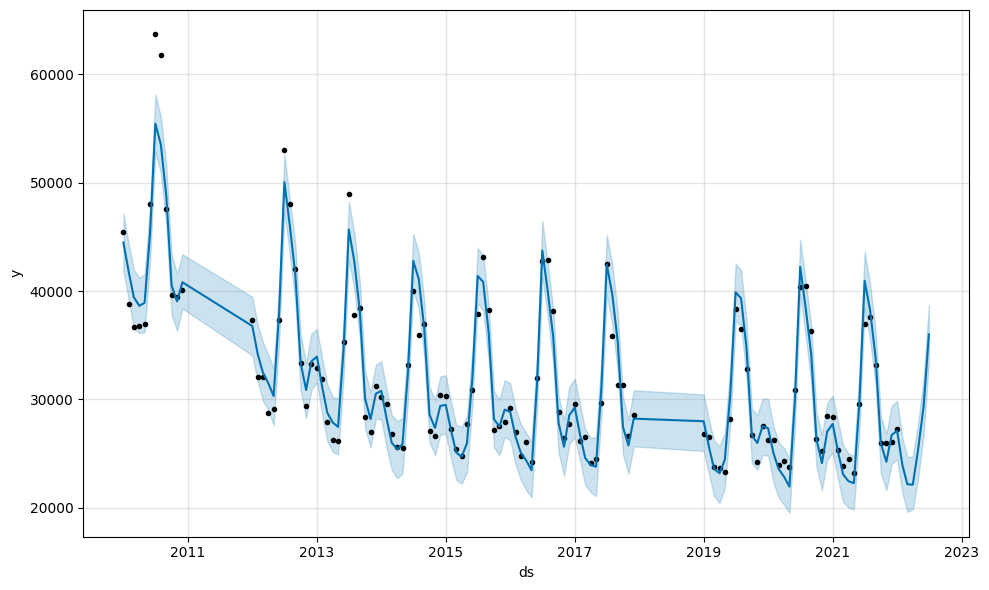

In [38]:
fig_6M = m.plot(predict_6M)

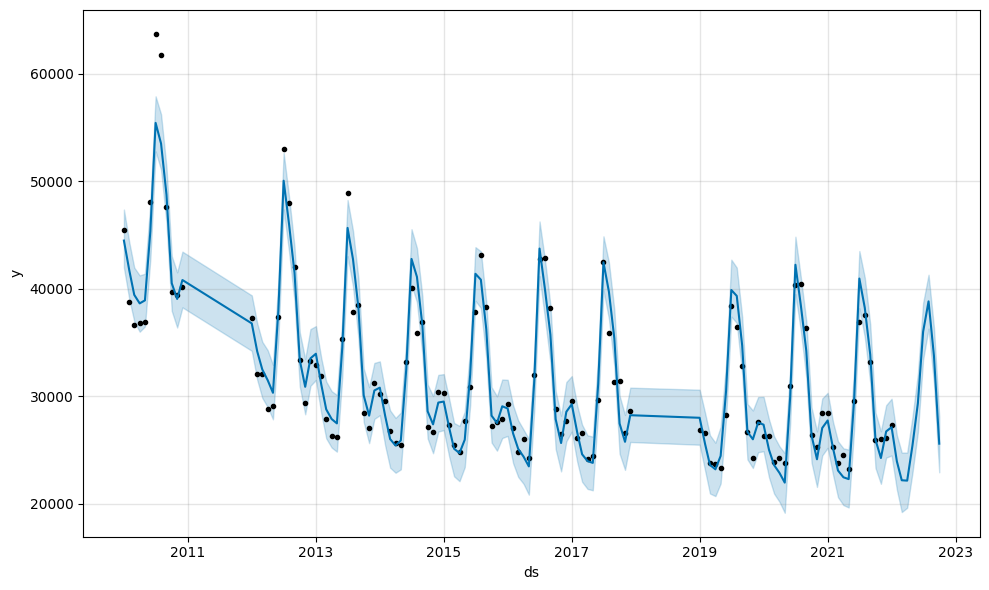

In [39]:
fig_9M = m.plot(predict_9M)

In [40]:
fig_plotly = plot_plotly(m, predict_9M)
fig_plotly.show()

In [41]:
fig_components = plot_components_plotly(m, predict_9M) 
fig_components.show()

# Yearly Data Forecast

In [42]:
yearly_data.columns = ['ds','y']

In [43]:
m = Prophet()
m.fit(yearly_data)

20:33:01 - cmdstanpy - INFO - Chain [1] start processing
20:33:02 - cmdstanpy - INFO - Chain [1] done processing


In [44]:
future_1Y = m.make_future_dataframe(periods=1, freq ='Y')
predict_1Y = m.predict(future_1Y)
predict_1Y[['ds','yhat','yhat_lower','yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
9,2019-12-31,28366.091563,25307.883334,31536.041288
10,2020-12-31,25767.749688,22854.782914,28686.191448
11,2021-12-31,25441.654058,22370.978882,28347.236760
12,2022-12-31,25005.967176,21855.675412,27914.588743
13,2023-12-31,24459.984852,21566.625619,27512.990642


In [45]:
future_10Y = m.make_future_dataframe(periods=10, freq='Y')
predict_10Y = m.predict(future_10Y)
predict_10Y[['ds','yhat','yhat_lower','yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
18,2028-12-31,17955.536265,15066.470672,21269.230491
19,2029-12-31,17629.440634,14456.096558,20722.590047
20,2030-12-31,17193.753753,14271.576223,20434.779619
21,2031-12-31,16647.771428,13476.067350,19691.942438
22,2032-12-31,14049.429553,11118.749967,17142.489366


In [46]:
future_20Y = m.make_future_dataframe(periods=20, freq='Y')
predict_20Y = m.predict(future_20Y)
predict_20Y[['ds','yhat','yhat_lower','yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
28,2038-12-31,9381.540330,6482.554333,12465.216661
29,2039-12-31,8835.558005,5737.418559,11976.912252
30,2040-12-31,6237.216130,3438.841447,9299.187920
31,2041-12-31,5911.120500,2940.163236,9144.763418
32,2042-12-31,5475.433618,2490.323759,8301.869123


In [47]:
fig_20M = plot_plotly(m, predict_20Y)
fig_20M.show()

In [48]:
fig_components = plot_components_plotly(m, predict_20Y) 
fig_components.show()

In [49]:
# To get closer look on prediction 
import plotly.graph_objects as go
df11 = predict_20Y[predict_20Y['ds']>='2022-03-01']
fig = go.Figure([go.Scatter(x=df11['ds'], y=df11['yhat'])])
# fig.update_xaxes(rangeslider_visible=True)
fig.update_xaxes(
      rangeslider_visible=True,
      rangeselector=dict(
          buttons=list([
              dict(count=20, label="20y", step="year", stepmode="backward"),
              dict(count=10, label="10y", step="year", stepmode="backward"),
              dict(count=1, label="1y", step="year", stepmode="backward"),
              dict(step="all")
          ])
      )
  )

## Metrics for Daily, Monthly, and Yearly Forecasts

Metrics for the Daily, Monthly, and Yearly forecasts are stored in the variable results and displayed and discussed at the end of this section

In [51]:
results = pd.DataFrame(columns = ['Classifier', 'R2','MAE','MAPE'])

In [50]:
#combining values of y and yhat from the original dataset and forecasted daily dataset
metric_D = predict_365D.set_index('ds')[['yhat']].join(daily_data.set_index('ds').y).reset_index()
#dropping null values of yhat from the 365 day forecast from the forecasted daily dataset
metric_D.dropna(inplace=True)

In [52]:
r2_D = r2(metric_D.y, metric_D.yhat)
mae_D = mae(metric_D.y, metric_D.yhat)
mape_D = mape(metric_D.y, metric_D.yhat)
results = results.append({'Classifier' : 'Daily Forecast', 'R2' : r2_D,'MAE': mae_D,'MAPE' : mape_D},ignore_index = True)

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/2421485063.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [53]:
metric_M = predict_1M.set_index('ds')[['yhat']].join(monthly_data.set_index('ds').y).reset_index()
metric_M.dropna(inplace=True)

#MAE, MAPE, and R^2 for Monthly Forecast

r2_M = r2(metric_M.y, metric_M.yhat)
mae_M = mae(metric_M.y, metric_M.yhat)
mape_M = mape(metric_M.y, metric_M.yhat)
results = results.append({'Classifier' : 'Monthly Forecast', 'R2' : r2_M,'MAE': mae_M,'MAPE' : mape_M},ignore_index = True)

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/2162987729.py:9: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [54]:
metric_Y = predict_1Y.set_index('ds')[['yhat']].join(yearly_data.set_index('ds').y).reset_index()
metric_Y.dropna(inplace=True)

#MAE, MAPE, and R^2 for Yearly Forecast

r2_Y = r2(metric_Y.y, metric_Y.yhat)
mae_Y = mae(metric_Y.y, metric_Y.yhat)
mape_Y = mape(metric_Y.y, metric_Y.yhat)
results = results.append({'Classifier' : 'Yearly Forecast', 'R2' : r2_Y,'MAE': mae_Y,'MAPE' : mape_Y},ignore_index = True)

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/481491462.py:9: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [55]:
results

,Classifier,R2,MAE,MAPE
0,Daily Forecast,0.849785,2092.863540,0.061108
1,Monthly Forecast,0.934522,1400.329258,0.041125
2,Yearly Forecast,0.713731,1987.004484,0.063924


A r-squared value of 0.70 shows a strong correlation between the values y and yhat, so all three forecasts present strong r-squared values. The Yearly Forecast scored the lowest with a r-squared or 0.713731

The MAPE metric represents the average deviation between the forecasted value (yhat) and actual values (y). All three forecasting models show a relatively strong MAPE since all are under 0.10 

In addition, all three forecasting models (Daily, Monthly, and Yearly) show a downward trend when observing the forecasting plots.

# Tune FBProphet model on the following parameters:

## a) Forecasting growth: Plausible values = logistic; linear (default parameter); flat

Metrics for the Forecasting Growth Models are stored in the variable result_1 and are displayed and discussed at the end of this section.

In [56]:
results_1 = pd.DataFrame(columns = ['Classifier', 'R2','MAE','MAPE'])

### Daily Forecasting Growth Tuning

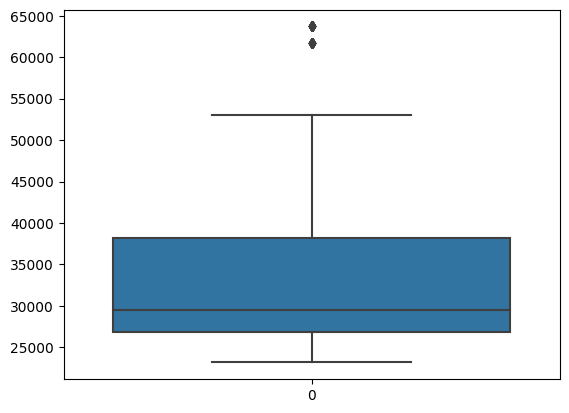

In [57]:
#use boxplot to determine floor and cap
sns.boxplot(daily_data['y'])
plt.show()

In [58]:
daily_data['cap'] = 55000
daily_data['floor'] = 20000
logistic_D = Prophet(growth='logistic')
logistic_D.fit(daily_data)

20:33:04 - cmdstanpy - INFO - Chain [1] start processing
20:33:06 - cmdstanpy - INFO - Chain [1] done processing


In [59]:
future_365D_logistic = logistic_D.make_future_dataframe(periods=365, freq='D')
future_365D_logistic['cap'] = 55000
future_365D_logistic['floor'] = 20000
predict_365D_logistic = logistic_D.predict(future_365D_logistic)
predict_365D_logistic[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2010-01-01,44228.028200,40350.842345,48210.960757
1,2010-01-02,44325.560754,40329.004700,48367.283043
2,2010-01-03,44427.547580,40696.005243,48291.919561
3,2010-01-04,44536.126677,40987.843095,48523.818267
4,2010-01-05,44607.304389,40592.483021,48567.877190
...,...,...,...,...
4744,2022-12-28,26519.357371,22854.829787,30254.434256
4745,2022-12-29,26521.235174,22572.843327,30276.404833
4746,2022-12-30,26546.835247,22712.382979,30134.044371
4747,2022-12-31,26624.437898,22819.673807,30251.379193


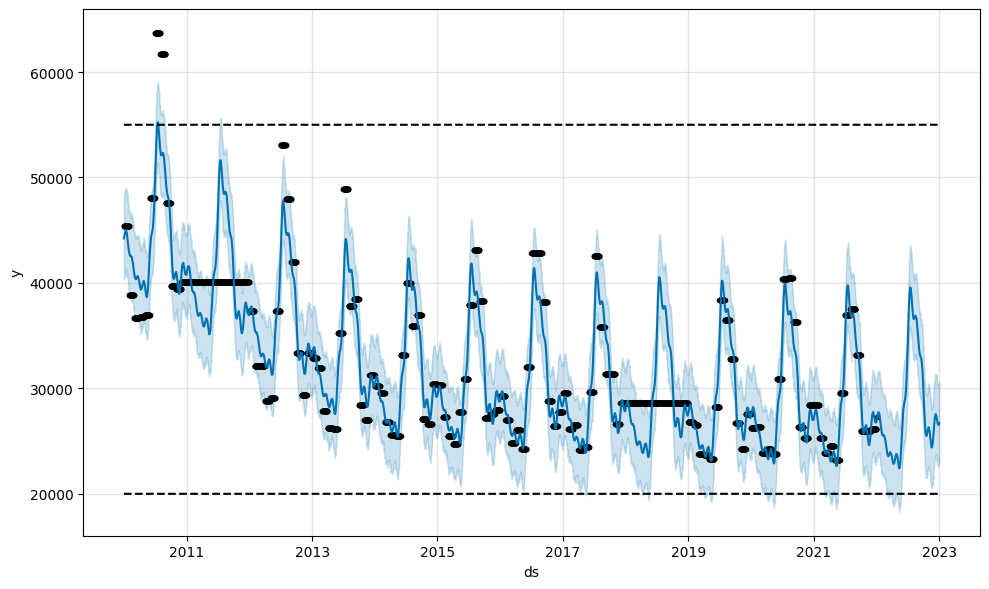

In [60]:
fig_logistic_D = logistic_D.plot(predict_365D_logistic)

In [61]:
daily_data['cap'] = 55000
flat_D = Prophet(growth='flat')
flat_D.fit(daily_data)

20:33:18 - cmdstanpy - INFO - Chain [1] start processing
20:33:18 - cmdstanpy - INFO - Chain [1] done processing


In [62]:
future_365D_flat = flat_D.make_future_dataframe(periods=365, freq='D')
future_365D_flat['cap'] = 55000
predict_365D_flat = flat_D.predict(future_365D_flat)
predict_365D_flat[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2010-01-01,31173.064000,23653.652349,38103.249941
1,2010-01-02,31353.669684,23940.620740,39235.869110
2,2010-01-03,31544.509782,23735.980589,38536.785843
3,2010-01-04,31733.111368,24002.663522,39084.448467
4,2010-01-05,31881.460182,24528.675987,39419.186302
...,...,...,...,...
4744,2022-12-28,30670.416229,23331.364243,37888.818831
4745,2022-12-29,30742.713051,24051.631014,38148.081049
4746,2022-12-30,30862.169665,23578.656720,38168.509401
4747,2022-12-31,31014.366345,24010.153820,38245.657964


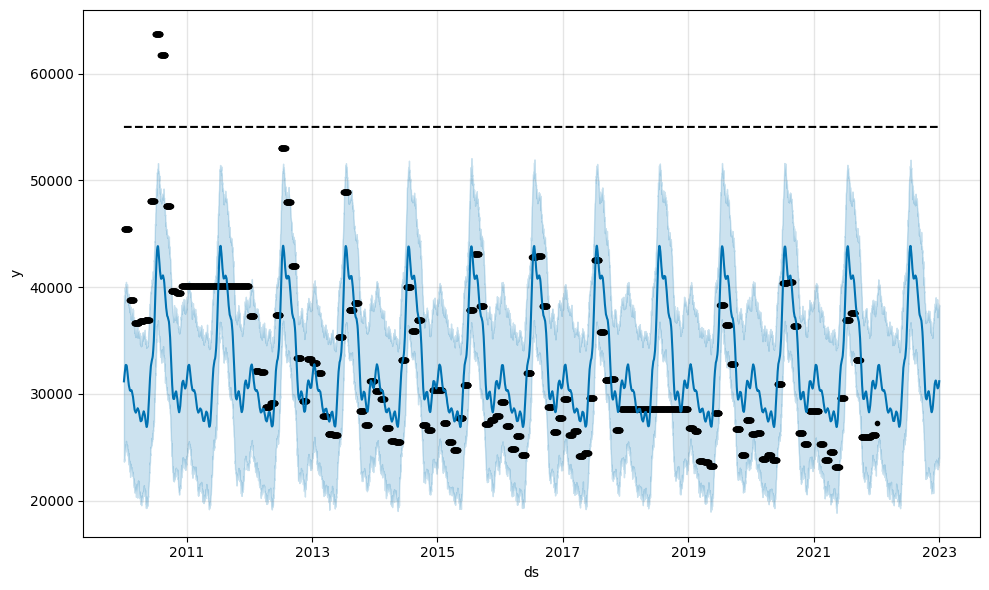

In [63]:
fig_flat_D = flat_D.plot(predict_365D_flat)

In [64]:
#Deriving MAE, MAPE, and R^2 for Daily Logistic Forecast
metric_logistic_D = predict_365D_logistic.set_index('ds')[['yhat']].join(daily_data.set_index('ds').y).reset_index()
metric_logistic_D.dropna(inplace=True)

r2_logistic_D = r2(metric_logistic_D.y, metric_logistic_D.yhat)
mae_logistic_D = mae(metric_logistic_D.y, metric_logistic_D.yhat)
mape_logistic_D = mape(metric_logistic_D.y, metric_logistic_D.yhat)

#Deriving MAE, MAPE, and R^2 for Daily Flat Forecast
metric_flat_D = predict_365D_flat.set_index('ds')[['yhat']].join(daily_data.set_index('ds').y).reset_index()
metric_flat_D.dropna(inplace=True)

r2_flat_D = r2(metric_flat_D.y, metric_flat_D.yhat)
mae_flat_D = mae(metric_flat_D.y, metric_flat_D.yhat)
mape_flat_D = mape(metric_flat_D.y, metric_flat_D.yhat)

In [65]:
#Comparing Metrics for Linear, Logistic, and Flat Growth of Daily Dataset
results_1 = results_1.append({'Classifier' : 'Daily Linear Forecast', 'R2' : r2_D,'MAE': mae_D,'MAPE' : mape_D},ignore_index = True)
results_1 = results_1.append({'Classifier' : 'Daily Logistic Forecast', 'R2' : r2_logistic_D,'MAE': mae_logistic_D,'MAPE' : mape_logistic_D},ignore_index = True)
results_1 = results_1.append({'Classifier' : 'Daily Flat Forecast', 'R2' : r2_flat_D,'MAE': mae_flat_D,'MAPE' : mape_flat_D},ignore_index = True)

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/3007914214.py:2: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/3007914214.py:3: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/3007914214.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



### Monthly Forecasting Growth Tuning

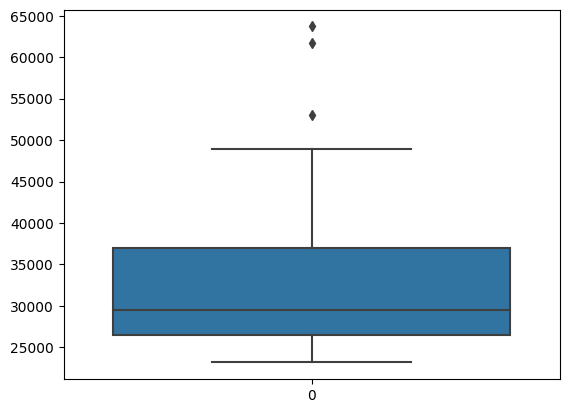

In [66]:
#use boxplot to determine floor and cap
sns.boxplot(monthly_data['y'])
plt.show()

In [67]:
monthly_data['cap'] = 55000
monthly_data['floor'] = 20000
logistic_M = Prophet(growth='logistic')
logistic_M.fit(monthly_data)

20:33:21 - cmdstanpy - INFO - Chain [1] start processing
20:33:21 - cmdstanpy - INFO - Chain [1] done processing


In [68]:
future_9M_logistic = logistic_D.make_future_dataframe(periods=9, freq='M')
future_9M_logistic['cap'] = 55000
future_9M_logistic['floor'] = 20000
predict_9M_logistic = logistic_D.predict(future_9M_logistic)
predict_9M_logistic[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2010-01-01,44228.028200,40698.248290,48132.311480
1,2010-01-02,44325.560754,40375.367761,48145.812374
2,2010-01-03,44427.547580,40374.242807,48143.346360
3,2010-01-04,44536.126677,40485.382805,48537.227634
4,2010-01-05,44607.304389,40989.276294,48511.151609
...,...,...,...,...
4388,2022-05-31,26478.876596,22601.074159,30468.550918
4389,2022-06-30,33260.757044,29186.809888,36961.252832
4390,2022-07-31,37165.271400,33607.963963,40996.187721
4391,2022-08-31,34768.065065,30899.719685,38573.635424


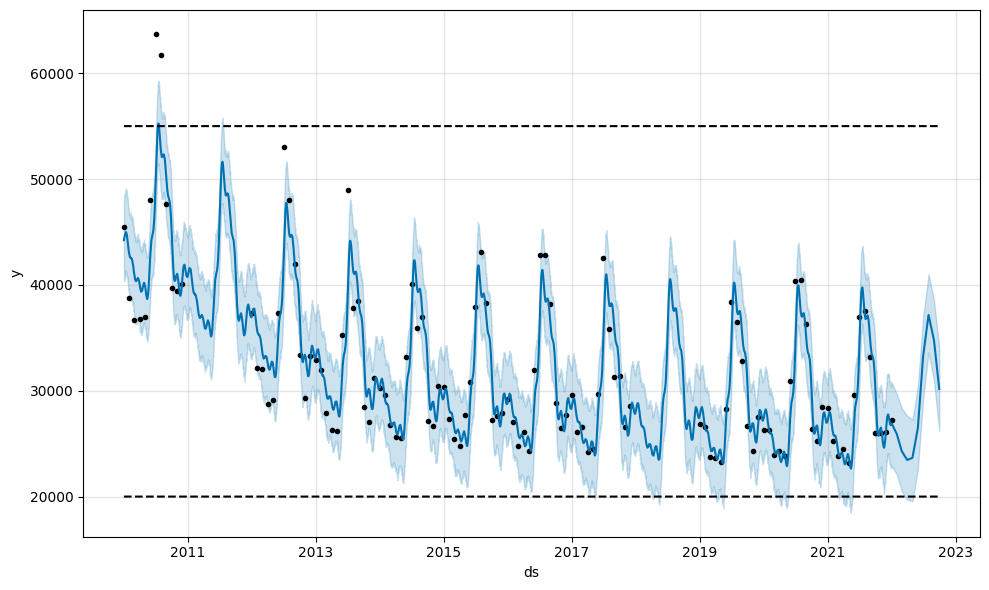

In [95]:
fig_logistic_M = logistic_M.plot(predict_9M_logistic)

In [70]:
monthly_data['cap'] = 55000
flat_M = Prophet(growth='flat')
flat_M.fit(monthly_data)

20:33:23 - cmdstanpy - INFO - Chain [1] start processing
20:33:23 - cmdstanpy - INFO - Chain [1] done processing


In [71]:
future_9M_flat = flat_D.make_future_dataframe(periods=9, freq='M')
future_9M_flat['cap'] = 55000
predict_9M_flat = flat_D.predict(future_9M_flat)
predict_9M_flat[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2010-01-01,31173.064000,23882.474089,38915.536015
1,2010-01-02,31353.669684,24005.113168,38522.182273
2,2010-01-03,31544.509782,24251.048461,39318.415150
3,2010-01-04,31733.111368,24133.869023,39534.372169
4,2010-01-05,31881.460182,24698.599490,39722.070205
...,...,...,...,...
4388,2022-05-31,30922.549584,23534.107279,38262.792698
4389,2022-06-30,37576.077628,29918.843432,44886.336580
4390,2022-07-31,41381.922430,33510.458802,48469.041044
4391,2022-08-31,38867.241053,31258.754103,46037.470529


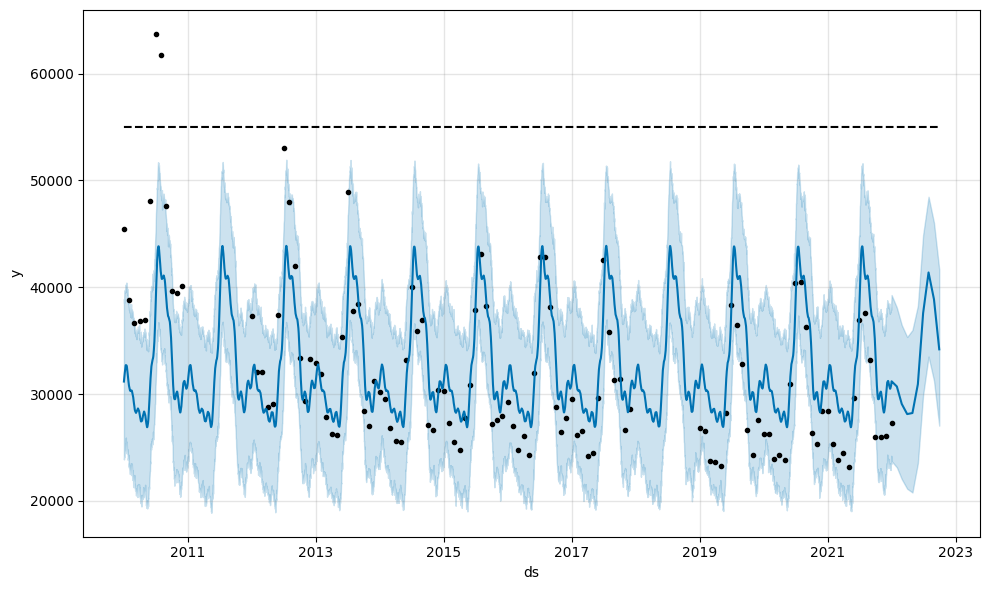

In [72]:
fig_flat_M = flat_M.plot(predict_9M_flat)

In [73]:
#Deriving MAE, MAPE, and R^2 for Monthly Logistic Forecast
metric_logistic_M = predict_9M_logistic.set_index('ds')[['yhat']].join(monthly_data.set_index('ds').y).reset_index()
metric_logistic_M.dropna(inplace=True)

r2_logistic_M = r2(metric_logistic_M.y, metric_logistic_M.yhat)
mae_logistic_M = mae(metric_logistic_M.y, metric_logistic_M.yhat)
mape_logistic_M = mape(metric_logistic_M.y, metric_logistic_M.yhat)

#Deriving MAE, MAPE, and R^2 for Monthly Flat Forecast
metric_flat_M = predict_9M_flat.set_index('ds')[['yhat']].join(monthly_data.set_index('ds').y).reset_index()
metric_flat_M.dropna(inplace=True)

r2_flat_M = r2(metric_flat_M.y, metric_flat_M.yhat)
mae_flat_M = mae(metric_flat_M.y, metric_flat_M.yhat)
mape_flat_M = mape(metric_flat_M.y, metric_flat_M.yhat)

In [74]:
#Comparing Metrics for Linear, Logistic, and Flat Growth of Monthly Dataset

results_1 = results_1.append({'Classifier' : 'Monthly Linear Forecast', 'R2' : r2_M,'MAE': mae_M,'MAPE' : mape_M},ignore_index = True)
results_1 = results_1.append({'Classifier' : 'Monthly Logistic Forecast', 'R2' : r2_logistic_M,'MAE': mae_logistic_M,'MAPE' : mape_logistic_M},ignore_index = True)
results_1 = results_1.append({'Classifier' : 'Monthly Flat Forecast', 'R2' : r2_flat_M,'MAE': mae_flat_M,'MAPE' : mape_flat_M},ignore_index = True)

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/1212168697.py:3: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/1212168697.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/1212168697.py:5: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



### Yearly Forecasting Growth Tuning

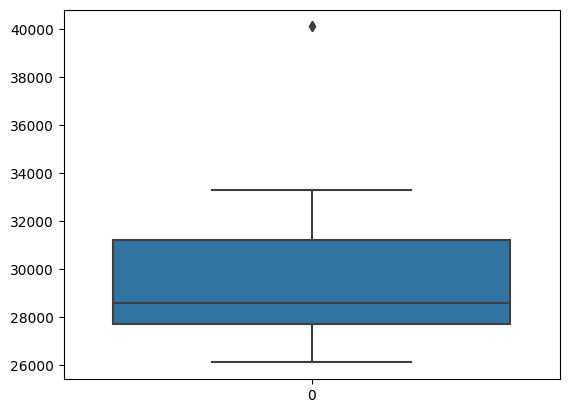

In [75]:
#use boxplot to determine floor and cap
sns.boxplot(yearly_data['y'])
plt.show()

In [76]:
yearly_data['cap'] = 40000
yearly_data['floor'] = 26000
logistic_Y = Prophet(growth='logistic')
logistic_Y.fit(yearly_data)

20:33:26 - cmdstanpy - INFO - Chain [1] start processing
20:33:26 - cmdstanpy - INFO - Chain [1] done processing


In [77]:
future_20Y_logistic = logistic_Y.make_future_dataframe(periods=20, freq='Y')
future_20Y_logistic['cap'] = 40000
future_20Y_logistic['floor'] = 26000
predict_20Y_logistic = logistic_Y.predict(future_20Y_logistic)
predict_20Y_logistic[['ds','yhat','yhat_lower','yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
28,2038-12-31,27873.039978,26585.284779,28974.615672
29,2039-12-31,28224.460418,27058.635295,29399.469030
30,2040-12-31,27206.905369,26091.815608,28373.796320
31,2041-12-31,27533.713502,26373.306091,28741.483390
32,2042-12-31,27873.039978,26747.599446,28998.647742


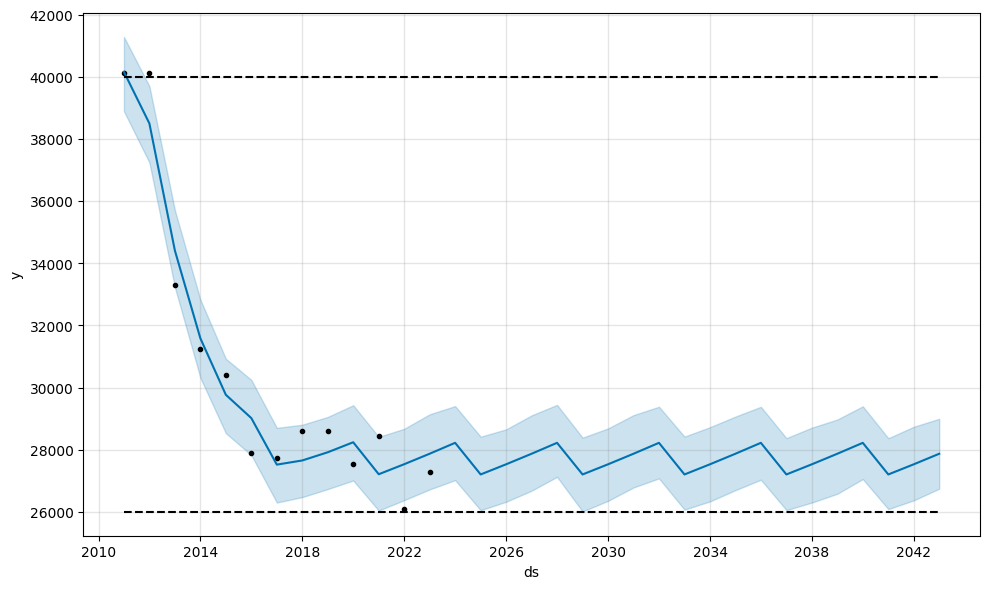

In [78]:
fig_logistic_Y = logistic_Y.plot(predict_20Y_logistic)

In [79]:
yearly_data['cap'] = 40000
flat_Y = Prophet(growth='flat')
flat_Y.fit(yearly_data)

20:33:27 - cmdstanpy - INFO - Chain [1] start processing
20:33:27 - cmdstanpy - INFO - Chain [1] done processing


In [80]:
future_20Y_flat = flat_Y.make_future_dataframe(periods=20, freq='Y')
future_20Y_flat['cap'] = 40000
predict_20Y_flat = flat_Y.predict(future_20Y_flat)
predict_20Y_flat[['ds','yhat','yhat_lower','yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
28,2038-12-31,30980.804690,25404.037563,36273.909462
29,2039-12-31,31942.183345,26309.483188,37696.438450
30,2040-12-31,29161.214951,23524.967605,34102.321186
31,2041-12-31,30053.432814,25083.969700,35799.389491
32,2042-12-31,30980.804690,25695.712085,36394.320959


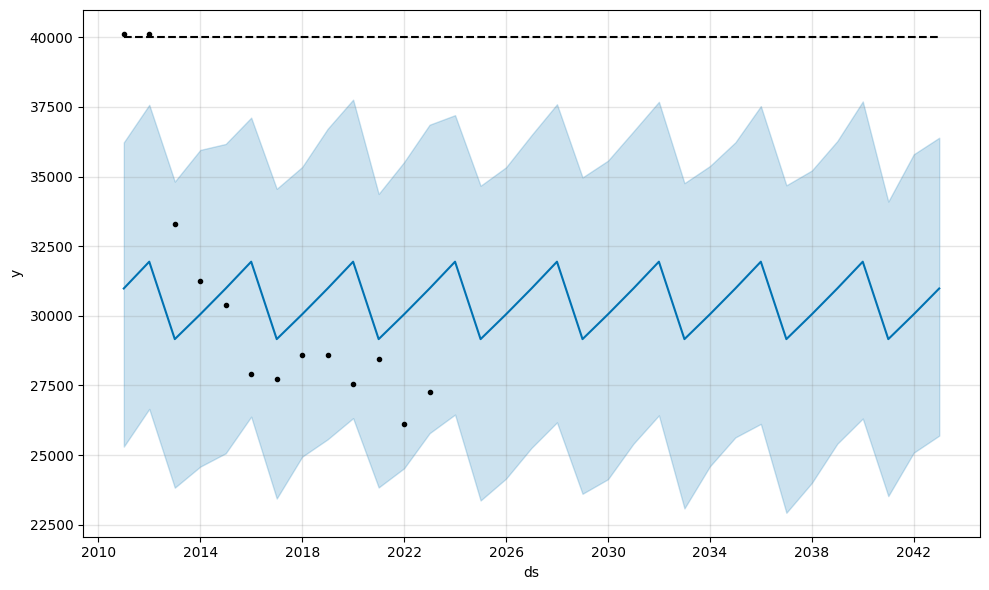

In [81]:
fig_flat_Y = flat_Y.plot(predict_20Y_flat)

In [82]:
#Deriving MAE, MAPE, and R^2 for Yearly Logistic Forecast
metric_logistic_Y = predict_20Y_logistic.set_index('ds')[['yhat']].join(yearly_data.set_index('ds').y).reset_index()
metric_logistic_Y.dropna(inplace=True)

r2_logistic_Y = r2(metric_logistic_Y.y, metric_logistic_Y.yhat)
mae_logistic_Y = mae(metric_logistic_Y.y, metric_logistic_Y.yhat)
mape_logistic_Y = mape(metric_logistic_Y.y, metric_logistic_Y.yhat)

#Deriving MAE, MAPE, and R^2 for Yearly Flat Forecast
metric_flat_Y = predict_20Y_flat.set_index('ds')[['yhat']].join(yearly_data.set_index('ds').y).reset_index()
metric_flat_Y.dropna(inplace=True)

r2_flat_Y = r2(metric_flat_Y.y, metric_flat_Y.yhat)
mae_flat_Y = mae(metric_flat_Y.y, metric_flat_Y.yhat)
mape_flat_Y = mape(metric_flat_Y.y, metric_flat_Y.yhat)

In [83]:
results_1 = results_1.append({'Classifier' : 'Yearly Linear Forecast', 'R2' : r2_Y,'MAE': mae_Y,'MAPE' : mape_Y},ignore_index = True)
results_1 = results_1.append({'Classifier' : 'Yearly Logistic Forecast', 'R2' : r2_logistic_Y,'MAE': mae_logistic_Y,'MAPE' : mape_logistic_Y},ignore_index = True)
results_1 = results_1.append({'Classifier' : 'Yearly Flat Forecast', 'R2' : r2_flat_Y,'MAE': mae_flat_Y,'MAPE' : mape_flat_Y},ignore_index = True)

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/3890118194.py:1: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/3890118194.py:2: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/3890118194.py:3: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



## Metrics for Forecasting Growth Models

In [84]:
results_1

,Classifier,R2,MAE,MAPE
0,Daily Linear Forecast,0.849785,2092.863540,0.061108
1,Daily Logistic Forecast,0.838328,2093.192267,0.060823
2,Daily Flat Forecast,0.404544,4343.799426,0.128761
3,Monthly Linear Forecast,0.934522,1400.329258,0.041125
4,Monthly Logistic Forecast,0.825026,2279.363272,0.066022
5,Monthly Flat Forecast,0.455556,4189.225082,0.126949
6,Yearly Linear Forecast,0.713731,1987.004484,0.063924
7,Yearly Logistic Forecast,0.956154,814.640754,0.027229
8,Yearly Flat Forecast,0.051310,3484.709792,0.108871


Typically an r-squared value of 0.70 shows a strong correlation between the values y and yhat, while an r-squared of 0.40 represents a weak correlation between the values. 

The MAPE metric represents the average deviation between the forecasted value (yhat) and actual values (y). The closer the metric is to 0, the stronger the model.

It is worth noting that the Yearly Flat Forecast scored the lowest r-squared value of 0.051310 and Yearly Logistic Forecast	scored the highest r-squared value of 0.956154. In addition, many of the models have a MAPE lower than 0.10 except for the Daily and Monthly Flat Forecasting Growth Models.

Overall, the flat forecasting growth performs the worse.

## b) Seasonality: Add manual seasonality by using the add_seasonality method. Test it with various values for ‘period’ and ‘fourier_order’.

Metrics for the Seasonality Models are stored in the variable result_2 and are displayed and discussed at the end of this section.

In [87]:
results_2 = pd.DataFrame(columns = ['Classifier', 'R2','MAE','MAPE'])

### Seasonality with fourier order = 5

20:33:28 - cmdstanpy - INFO - Chain [1] start processing
20:33:31 - cmdstanpy - INFO - Chain [1] done processing


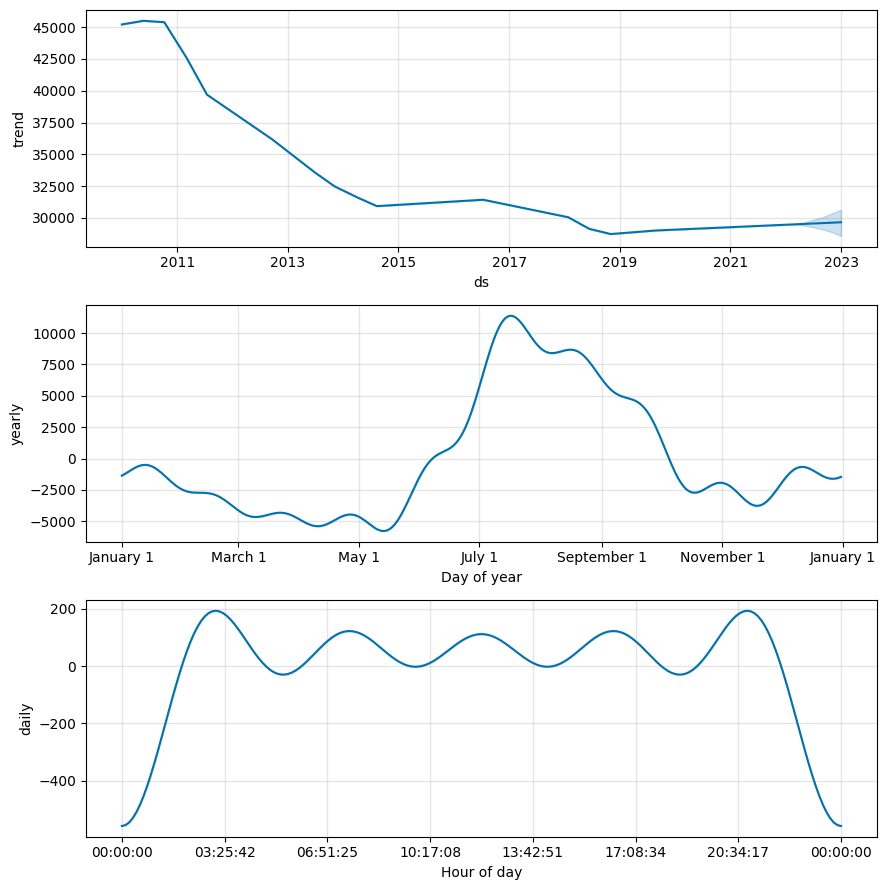

In [85]:
seasonality_D1 = Prophet(weekly_seasonality=False)
seasonality_D1.add_seasonality(name='daily', period=1, fourier_order=5)
forecast_seasonality_D1 = seasonality_D1.fit(daily_data).predict(future_365D)
fig = seasonality_D1.plot_components(forecast_seasonality_D1)

### Seasonality with fourier order = 20

20:33:34 - cmdstanpy - INFO - Chain [1] start processing
20:33:38 - cmdstanpy - INFO - Chain [1] done processing


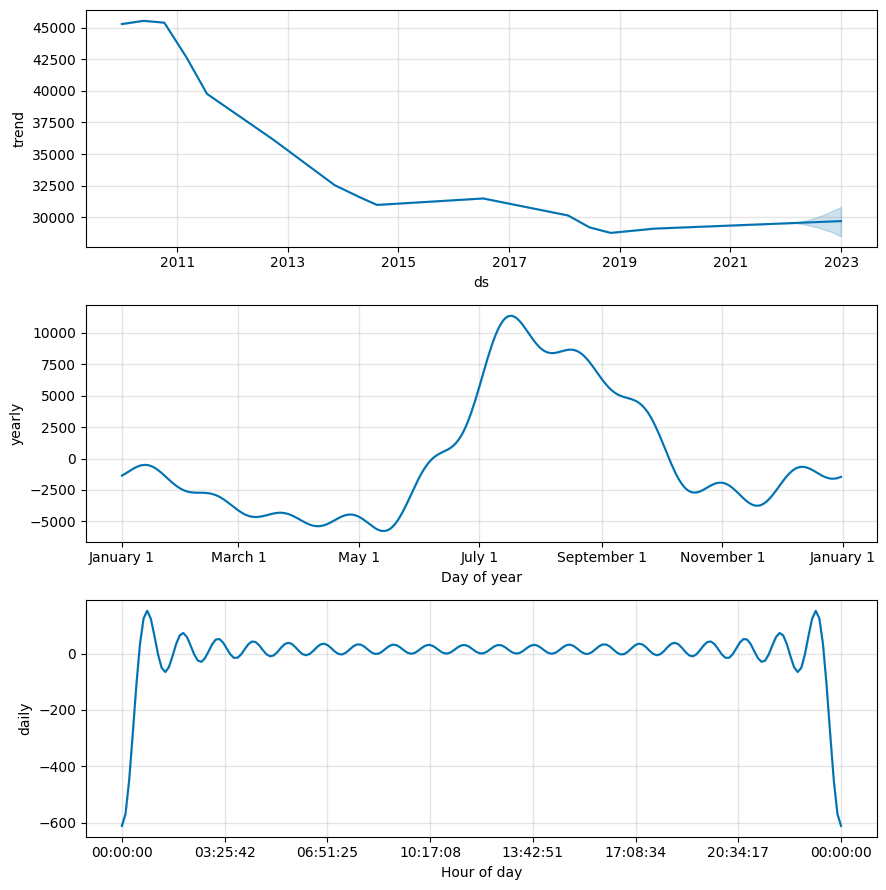

In [86]:
seasonality_D2 = Prophet(weekly_seasonality=False)
seasonality_D2.add_seasonality(name='daily', period=1, fourier_order=20)
forecast_seasonality_D2 = seasonality_D2.fit(daily_data).predict(future_365D)
fig = seasonality_D2.plot_components(forecast_seasonality_D2)

Changing the Fourier Order from 5 to 20 showed more volatility in the Daily Chart. 

## Metrics for Seasonality Models

In [88]:
#Deriving MAE, MAPE, and R^2 for Seasonality of Fourier = 5
metric_seasonality_D1 = forecast_seasonality_D1.set_index('ds')[['yhat']].join(daily_data.set_index('ds').y).reset_index()
metric_seasonality_D1.dropna(inplace=True)

r2_seasonality_D1 = r2(metric_seasonality_D1.y, metric_seasonality_D1.yhat)
mae_seasonality_D1 = mae(metric_seasonality_D1.y, metric_seasonality_D1.yhat)
mape_seasonality_D1 = mape(metric_seasonality_D1.y, metric_seasonality_D1.yhat)

#Deriving MAE, MAPE, and R^2 for Seasonality of Fourier = 20
metric_seasonality_D2 = forecast_seasonality_D2.set_index('ds')[['yhat']].join(daily_data.set_index('ds').y).reset_index()
metric_seasonality_D2.dropna(inplace=True)

r2_seasonality_D2 = r2(metric_seasonality_D2.y, metric_seasonality_D2.yhat)
mae_seasonality_D2 = mae(metric_seasonality_D2.y, metric_seasonality_D2.yhat)
mape_seasonality_D2 = mape(metric_seasonality_D2.y, metric_seasonality_D2.yhat)

results_2 = results_2.append({'Classifier' : 'Seasonality Fourier = 5 Forecast', 'R2' : r2_seasonality_D1,'MAE': mae_seasonality_D1,'MAPE' : mape_seasonality_D1},ignore_index = True)
results_2 = results_2.append({'Classifier' : 'Seasonality Fourier = 20 Forecast', 'R2' : r2_seasonality_D2,'MAE': mae_seasonality_D2,'MAPE' : mape_seasonality_D2},ignore_index = True)

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/1561784906.py:17: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/1561784906.py:18: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [89]:
results_2

,Classifier,R2,MAE,MAPE
0,Seasonality Fourier = 5 Forecast,0.849215,2090.951601,0.061007
1,Seasonality Fourier = 20 Forecast,0.849153,2091.074849,0.061009


Both Seasonality Models performed very similarly. The r-squared values are very similar for both models, and they are both over 0.70 showing strong correlation between the y and yhat values.

In addition, the MAPE for both models is also very similar. They both perform well since the MAPE for each model is under 0.10

## c. Trend Changepoints: Tune the ‘n_changepoints’ and ‘changepoint_prior_scale’ arguments/parameters

Metrics for the Trend Changepoint Models are stored in the variable result_3 and are displayed and discussed at the end of this section.

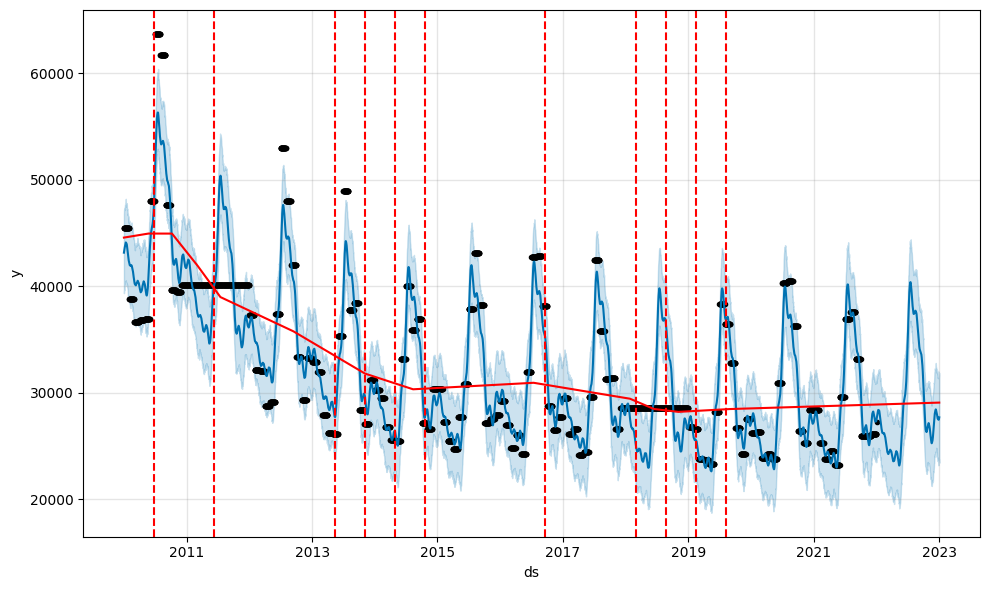

In [112]:
from prophet.plot import add_changepoints_to_plot
fig = m.plot(predict_365D)
a = add_changepoints_to_plot(fig.gca(), m, predict_365D)

In the figure above, it is worth noting that the red dashed lines represent the significant number of changepoints in this forecasting model. Prophet automatically chooses the number of changepoints, so for this model there are 11 changepoints. When tuning the number of changepoints, we will increase the number to 30 to see how the performance of the model changes.

In [116]:
#cppc = changepoint_prior_scale
m = Prophet(changepoint_prior_scale=10)
trend_cppc = m.fit(daily_data).predict(predict_365D)

21:03:12 - cmdstanpy - INFO - Chain [1] start processing
21:03:18 - cmdstanpy - INFO - Chain [1] done processing


In [117]:
#npcs = n_changepoints
m = Prophet(n_changepoints=30)
trend_ncps = m.fit(daily_data).predict(predict_365D)

21:03:20 - cmdstanpy - INFO - Chain [1] start processing
21:03:22 - cmdstanpy - INFO - Chain [1] done processing


## Metrics for Trend Changepoints Models

In [118]:
metric_trend_cppc = trend_cppc.set_index('ds')[['yhat']].join(daily_data.set_index('ds').y).reset_index()
metric_trend_cppc.dropna(inplace=True)


r2_trend_cppc = r2(metric_trend_cppc.y, metric_trend_cppc.yhat)
mae_trend_cppc = mae(metric_trend_cppc.y, metric_trend_cppc.yhat)
mape_trend_cppc = mape(metric_trend_cppc.y, metric_trend_cppc.yhat)

metric_trend_ncps = trend_ncps.set_index('ds')[['yhat']].join(daily_data.set_index('ds').y).reset_index()
metric_trend_ncps.dropna(inplace=True)


r2_trend_ncps = r2(metric_trend_ncps.y, metric_trend_ncps.yhat)
mae_trend_ncps = mae(metric_trend_ncps.y, metric_trend_ncps.yhat)
mape_trend_ncps = mape(metric_trend_ncps.y, metric_trend_ncps.yhat)

In [119]:
results_3 = pd.DataFrame(columns = ['Classifier', 'R2','MAE','MAPE'])

In [121]:
results_3 = results_3.append({'Classifier' : 'Default Trend Changepoint', 'R2' : r2_D,'MAE': mae_D,'MAPE' : mape_D},ignore_index = True)
results_3 = results_3.append({'Classifier' : 'Changepoint Prior Scale', 'R2' : r2_trend_cppc,'MAE': mae_trend_cppc,'MAPE' : mape_trend_cppc},ignore_index = True)
results_3 = results_3.append({'Classifier' : 'Number of Changepoints', 'R2' : r2_trend_ncps,'MAE': mae_trend_ncps,'MAPE' : mape_trend_ncps},ignore_index = True)

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/1025625330.py:1: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/1025625330.py:2: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/1025625330.py:3: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [122]:
results_3

,Classifier,R2,MAE,MAPE
0,Default Trend Changepoint,0.849785,2092.863540,0.061108
1,Changepoint Prior Scale,0.878826,1943.448258,0.057536
2,Number of Changepoints,0.857925,2074.023450,0.060642


For the Change Point Prior Scale tuning, we increased the scale from 0.05 to 10. Increasing the scale makes the trend more flexible. When comparing the default model to the tuned model, the metrics slightly improved. Overall, both models are still strong fits of the data.

For the Number of Changepoints tuning, the default number of changepoints was 11. When we chose to increase the number of changepoints, the tuned model performed slighyl better than the original model. Once again, both models are still strong fits of the data.

# Boroughs (USING MONTHLY DATASET)

Metrics for all 5 Borough Models are stored in the variable result_4 and are displayed and discussed at the end of this section.

In [134]:
results_4 = pd.DataFrame(columns = ['Classifier', 'R2','MAE','MAPE'])

In [123]:
df4 = df.groupby(['Revenue Month'])[['Consumption (KWH)']].mean().reset_index()
df4

,Revenue Month,Consumption (KWH)
0,2010-01-01,45446.030782
1,2010-02-01,38808.144583
2,2010-03-01,36667.210941
3,2010-04-01,36808.514463
4,2010-05-01,36933.632880
...,...,...
116,2021-09-01,33186.180491
117,2021-10-01,25960.355783
118,2021-11-01,25986.352243
119,2021-12-01,26110.544916


In [124]:
df['Borough'].value_counts()

BROOKLYN                    155508
MANHATTAN                   104365
BRONX                        92633
QUEENS                       47550
STATEN ISLAND                 3101
NON DEVELOPMENT FACILITY      2343
FHA                           1531
Name: Borough, dtype: int64

In [125]:
brooklyn = df[df['Borough'] == 'BROOKLYN']
manhattan = df[df['Borough'] == 'MANHATTAN']
bronx = df[df['Borough'] == 'BRONX']
queens = df[df['Borough'] == 'QUEENS']
statenisland = df[df['Borough'] == 'STATEN ISLAND']

## Brooklyn Forecasting

In [126]:
brooklyn_df = brooklyn[['Revenue Month', 'Consumption (KWH)']]
brooklyn_df

,Revenue Month,Consumption (KWH)
84,2010-01-01,0
85,2010-01-01,69840
86,2010-01-01,64560
87,2010-01-01,71040
88,2010-01-01,71280
...,...,...
407026,2022-01-01,0
407027,2022-01-01,0
407028,2022-01-01,59600
407029,2022-01-01,84000


In [127]:
brooklyn_df = brooklyn_df.groupby(pd.PeriodIndex(brooklyn_df['Revenue Month'], freq = 'M'))['Consumption (KWH)'].mean().reset_index()
brooklyn_df['Revenue Month'] = brooklyn_df['Revenue Month'].apply(lambda i: str(i).replace(' Q', '')).apply(lambda i: pd.to_datetime(i))

In [128]:
brooklyn_df.columns = ['ds', 'y']
brooklyn_df

,ds,y
0,2010-01-01,37531.571903
1,2010-02-01,31871.289730
2,2010-03-01,30244.381779
3,2010-04-01,31023.975054
4,2010-05-01,29442.510846
...,...,...
116,2021-09-01,26181.899172
117,2021-10-01,21488.267871
118,2021-11-01,21697.339353
119,2021-12-01,21538.297968


In [129]:
brooklyn_df.columns[brooklyn_df.isnull().any()]

Index([], dtype='object')

In [130]:
bm1 = Prophet()
bm1 = bm1.fit(brooklyn_df)

23:45:33 - cmdstanpy - INFO - Chain [1] start processing
23:45:33 - cmdstanpy - INFO - Chain [1] done processing


In [131]:
future_brooklyn_9M = bm1.make_future_dataframe(periods = 9, freq = 'M')
forecast_brooklyn_9M = bm1.predict(brooklyn_df)
forecast_brooklyn_9M[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
116,2021-09-01,27082.190330,24584.052461,29357.613263
117,2021-10-01,21129.370725,18913.824038,23347.481132
118,2021-11-01,19687.502161,17501.980732,21945.900141
119,2021-12-01,22002.472717,19824.701704,24335.971438
120,2022-01-01,22431.527210,20067.908327,24834.945880


In [133]:
fig_plotly = plot_plotly(bm1, forecast_brooklyn_9M)
fig_plotly.show()

In [135]:
metric_brooklyn = forecast_brooklyn_9M.set_index('ds')[['yhat']].join(brooklyn_df.set_index('ds').y).reset_index()
metric_brooklyn.dropna(inplace=True)

#MAE, MAPE, and R^2 for Brooklyn Forecast Model

r2_brooklyn = r2(metric_brooklyn.y, metric_brooklyn.yhat)
mae_brooklyn = mae(metric_brooklyn.y, metric_brooklyn.yhat)
mape_brooklyn = mape(metric_brooklyn.y, metric_brooklyn.yhat)
results_4 = results_4.append({'Classifier' : 'Brooklyn Forecast', 'R2' : r2_brooklyn,'MAE': mae_brooklyn,'MAPE' : mape_brooklyn},ignore_index = True)

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/3224733840.py:9: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



### Manhattan Forecasting

In [136]:
manhattan_df = manhattan[['Revenue Month', 'Consumption (KWH)']]
manhattan_df

,Revenue Month,Consumption (KWH)
204,2010-01-01,113200
205,2010-02-01,102000
206,2010-03-01,76800
207,2010-04-01,68400
208,2010-05-01,77600
...,...,...
406413,2021-11-01,195200
406414,2021-12-01,0
406415,2021-12-01,196800
406416,2022-01-01,0


In [137]:
manhattan_df = manhattan_df.groupby(pd.PeriodIndex(manhattan_df['Revenue Month'], freq = 'M'))['Consumption (KWH)'].mean().reset_index()
manhattan_df['Revenue Month'] = manhattan_df['Revenue Month'].apply(lambda i: str(i).replace(' Q', '')).apply(lambda i: pd.to_datetime(i))

In [138]:
manhattan_df .columns = ['ds', 'y']
manhattan_df 

,ds,y
0,2010-01-01,49050.579200
1,2010-02-01,42323.036278
2,2010-03-01,40555.858044
3,2010-04-01,40533.979528
4,2010-05-01,41163.179528
...,...,...
116,2021-09-01,39539.059908
117,2021-10-01,29403.375576
118,2021-11-01,29227.390553
119,2021-12-01,29570.405530


In [139]:
manhattan_df.columns[manhattan_df.isnull().any()]

Index([], dtype='object')

In [140]:
mm1 = Prophet()
mm1 = mm1.fit(manhattan_df)

23:45:35 - cmdstanpy - INFO - Chain [1] start processing
23:45:35 - cmdstanpy - INFO - Chain [1] done processing


In [141]:
future_manhattan_9M = mm1.make_future_dataframe(periods = 9, freq = 'M')
forecast_manhattan_9M = mm1.predict(manhattan_df)
forecast_manhattan_9M[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
116,2021-09-01,40071.542438,36938.479808,43255.035438
117,2021-10-01,30431.387189,27649.009367,33577.369080
118,2021-11-01,28497.164769,25590.214431,31485.633094
119,2021-12-01,31156.587674,28004.692222,34181.735354
120,2022-01-01,31240.445821,28243.887252,34414.054792


In [142]:
fig_plotly = plot_plotly(mm1, forecast_manhattan_9M)
fig_plotly.show()

In [143]:
metric_manhattan = forecast_manhattan_9M.set_index('ds')[['yhat']].join(manhattan_df.set_index('ds').y).reset_index()
metric_manhattan.dropna(inplace=True)

#MAE, MAPE, and R^2 for Manhattan Forecasting Model

r2_manhattan = r2(metric_manhattan.y, metric_manhattan.yhat)
mae_manhattan = mae(metric_manhattan.y, metric_manhattan.yhat)
mape_manhattan = mape(metric_manhattan.y, metric_manhattan.yhat)
results_4 = results_4.append({'Classifier' : 'Manhattan Forecast', 'R2' : r2_manhattan,'MAE': mae_manhattan,'MAPE' : mape_manhattan},ignore_index = True)

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/1911322144.py:9: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



### Bronx Forecasting 

In [144]:
bronx_df = bronx[['Revenue Month', 'Consumption (KWH)']]
bronx_df

,Revenue Month,Consumption (KWH)
0,2010-01-01,128800
1,2010-02-01,115200
2,2010-03-01,103200
3,2010-04-01,105600
4,2010-05-01,97600
...,...,...
404914,2021-09-01,60800
404915,2021-10-01,54400
404916,2021-11-01,75200
404917,2021-12-01,93600


In [145]:
bronx_df = bronx_df.groupby(pd.PeriodIndex(bronx_df['Revenue Month'], freq = 'M'))['Consumption (KWH)'].mean().reset_index()
bronx_df['Revenue Month'] = bronx_df['Revenue Month'].apply(lambda i: str(i).replace(' Q', '')).apply(lambda i: pd.to_datetime(i))

In [146]:
bronx_df.columns = ['ds', 'y']
bronx_df

,ds,y
0,2010-01-01,50028.041121
1,2010-02-01,43427.414365
2,2010-03-01,39666.351786
3,2010-04-01,39226.902309
4,2010-05-01,40515.679144
...,...,...
116,2021-09-01,38334.944591
117,2021-10-01,30166.145119
118,2021-11-01,30127.467018
119,2021-12-01,29981.315303


In [147]:
bronx_df.columns[bronx_df.isnull().any()]

Index([], dtype='object')

In [148]:
bm2 = Prophet()
bm2 = bm2.fit(bronx_df)

23:45:36 - cmdstanpy - INFO - Chain [1] start processing
23:45:36 - cmdstanpy - INFO - Chain [1] done processing


In [149]:
future_bronx_9M = bm2.make_future_dataframe(periods = 9, freq = 'M')
forecast_bronx_9M = bm2.predict(bronx_df)
forecast_bronx_9M[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
116,2021-09-01,39628.581704,36772.075110,42502.283587
117,2021-10-01,30678.327813,27986.594311,33543.974734
118,2021-11-01,28761.905038,25992.401204,31655.125823
119,2021-12-01,31223.400966,28407.107229,33957.967618
120,2022-01-01,31554.664534,28735.840702,34545.524799


In [150]:
fig_plotly = plot_plotly(bm2, forecast_bronx_9M)
fig_plotly.show()

In [151]:
metric_bronx = forecast_bronx_9M.set_index('ds')[['yhat']].join(bronx_df.set_index('ds').y).reset_index()
metric_bronx.dropna(inplace=True)

#MAE, MAPE, and R^2 for Bronx Forecasting Model

r2_bronx = r2(metric_bronx.y, metric_bronx.yhat)
mae_bronx = mae(metric_bronx.y, metric_bronx.yhat)
mape_bronx = mape(metric_bronx.y, metric_bronx.yhat)
results_4 = results_4.append({'Classifier' : 'Bronx Forecast', 'R2' : r2_bronx,'MAE': mae_bronx,'MAPE' : mape_bronx},ignore_index = True)

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/2421535755.py:9: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



### Queens Forecasting

In [152]:
queens_df = queens[['Revenue Month', 'Consumption (KWH)']]
queens_df

,Revenue Month,Consumption (KWH)
594,2010-01-01,0
595,2010-01-01,25920
596,2010-01-01,29640
597,2010-01-01,24840
598,2010-01-01,32160
...,...,...
406922,2022-01-01,52400
406923,2022-01-01,36880
406924,2022-01-01,32560
406925,2022-01-01,6080


In [153]:
queens_df = queens_df.groupby(pd.PeriodIndex(queens_df['Revenue Month'], freq = 'M'))['Consumption (KWH)'].mean().reset_index()
queens_df['Revenue Month'] = queens_df['Revenue Month'].apply(lambda i: str(i).replace(' Q', '')).apply(lambda i: pd.to_datetime(i))

In [154]:
queens_df.columns = ['ds', 'y']
queens_df

,ds,y
0,2010-01-01,41671.350877
1,2010-02-01,32817.835294
2,2010-03-01,32033.334646
3,2010-04-01,31881.952756
4,2010-05-01,33372.609848
...,...,...
116,2021-09-01,24739.503741
117,2021-10-01,18441.145408
118,2021-11-01,19372.173611
119,2021-12-01,19082.034286


In [155]:
queens_df.columns[queens_df.isnull().any()]

Index([], dtype='object')

In [156]:
qm1 = Prophet()
qm1 = qm1.fit(queens_df)

23:45:38 - cmdstanpy - INFO - Chain [1] start processing
23:45:38 - cmdstanpy - INFO - Chain [1] done processing


In [157]:
future_queens_9M = qm1.make_future_dataframe(periods = 9, freq = 'M')
forecast_queens_9M = qm1.predict(future_queens_9M)
forecast_queens_9M[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
125,2022-05-31,18834.707223,15923.760645,21838.372946
126,2022-06-30,25863.703846,22796.940005,28709.592907
127,2022-07-31,27772.441779,24854.025011,30736.907554
128,2022-08-31,25766.201830,22766.094793,28838.868110
129,2022-09-30,17573.362510,14263.809408,20686.738553


In [158]:
fig_plotly = plot_plotly(qm1, forecast_queens_9M)
fig_plotly.show()

In [159]:
metric_queens = forecast_queens_9M.set_index('ds')[['yhat']].join(queens_df.set_index('ds').y).reset_index()
metric_queens.dropna(inplace=True)

#MAE, MAPE, and R^2 for Queens Forecasting Model

r2_queens = r2(metric_queens.y, metric_queens.yhat)
mae_queens = mae(metric_queens.y, metric_queens.yhat)
mape_queens = mape(metric_queens.y, metric_queens.yhat)
results_4 = results_4.append({'Classifier' : 'Queens Forecast', 'R2' : r2_queens,'MAE': mae_queens,'MAPE' : mape_queens},ignore_index = True)

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/3966791038.py:9: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



### Staten Island Forecasting

In [160]:
statenisland_df = statenisland[['Revenue Month', 'Consumption (KWH)']]
statenisland_df

,Revenue Month,Consumption (KWH)
1419,2010-09-01,360800
1458,2010-01-01,0
1459,2010-01-01,300000
1460,2010-02-01,267200
1461,2010-03-01,240800
...,...,...
404744,2021-12-01,34502
404745,2022-01-01,0
404746,2022-01-01,334342
404747,2022-01-01,0


In [161]:
statenisland_df = statenisland_df.groupby(pd.PeriodIndex(statenisland_df['Revenue Month'], freq = 'M'))['Consumption (KWH)'].mean().reset_index()
statenisland_df['Revenue Month'] = statenisland_df['Revenue Month'].apply(lambda i: str(i).replace(' Q', '')).apply(lambda i: pd.to_datetime(i))

In [162]:
statenisland_df.columns = ['ds', 'y']
statenisland_df

,ds,y
0,2010-01-01,130853.652174
1,2010-02-01,132395.400000
2,2010-03-01,117703.750000
3,2010-04-01,97643.347826
4,2010-05-01,109158.695652
...,...,...
116,2021-09-01,131800.000000
117,2021-10-01,99293.120000
118,2021-11-01,94487.840000
119,2021-12-01,96181.120000


In [163]:
statenisland_df.columns[statenisland_df.isnull().any()]

Index([], dtype='object')

In [164]:
sim1 = Prophet()
sim1 = sim1.fit(statenisland_df)

23:45:39 - cmdstanpy - INFO - Chain [1] start processing
23:45:39 - cmdstanpy - INFO - Chain [1] done processing


In [165]:
future_statenisland_9M = sim1.make_future_dataframe(periods = 10, freq = 'Y')
forecast_statenisland_9M = sim1.predict(future_statenisland_9M)
forecast_statenisland_9M[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
126,2027-12-31,96894.701131,88840.799514,104880.737027
127,2028-12-31,100495.429838,92563.893229,108653.048638
128,2029-12-31,98743.505569,90791.678832,106732.865390
129,2030-12-31,96946.639444,87847.150708,105427.588220
130,2031-12-31,95107.200979,85973.309980,104246.912321


In [166]:
fig_plotly = plot_plotly(sim1, forecast_statenisland_9M)
fig_plotly.show()

In [167]:
metric_statenisland = forecast_statenisland_9M.set_index('ds')[['yhat']].join(statenisland_df.set_index('ds').y).reset_index()
metric_statenisland.dropna(inplace=True)

#MAE, MAPE, and R^2 for Staten Island Forecasting Model

r2_statenisland = r2(metric_statenisland.y, metric_statenisland.yhat)
mae_statenisland = mae(metric_statenisland.y, metric_statenisland.yhat)
mape_statenisland = mape(metric_statenisland.y, metric_statenisland.yhat)
results_4 = results_4.append({'Classifier' : 'Staten Island Forecast', 'R2' : r2_statenisland,'MAE': mae_statenisland,'MAPE' : mape_statenisland},ignore_index = True)

/var/folders/r2/c3sggvv16n3bbr27sc7hx0pr0000gn/T/ipykernel_14595/2340330942.py:9: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



## Borough Metrics

In [168]:
results_4

,Classifier,R2,MAE,MAPE
0,Brooklyn Forecast,0.920594,1320.317456,0.046412
1,Manhattan Forecast,0.931335,1656.092425,0.043550
2,Bronx Forecast,0.928642,1623.071073,0.042270
3,Queens Forecast,0.899167,1532.580332,0.059561
4,Staten Island Forecast,0.928116,4692.874945,0.039124


All of the r-squared values for each borough shows that the forecasting model is very strong since they are all over 0.70. In addition, all of the borough models performed well with the MAPE metric since the all of the MAPE are under 0.10.

We chose to use the Monthly Dataset for all boroughs since it has the strongest r-squared score and MAPE in the original dataset. The metrics show that all five models performed exceptionally well. All of the r-squared scores (rounded) are greater than or equal to 0.90, and the MAPE are all under 0.10 

In addition, all 5 Borough Models show a downward trend when comparing the original dataset and the forecasted dataset.